# Load dataset

In [3]:
import numpy as np
import pandas as pd
import seaborn as sns
sns.set(style="darkgrid")
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from scipy import stats

In [4]:
smart_grid = pd.read_csv("/content/drive/MyDrive/CSE_475_ML_Project/Data_for_UCI_named.csv")

smart_grid.head()

,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4,stab,stabf
0,2.959060,3.079885,8.381025,9.780754,3.763085,-0.782604,-1.257395,-1.723086,0.650456,0.859578,0.887445,0.958034,0.055347,unstable
1,9.304097,4.902524,3.047541,1.369357,5.067812,-1.940058,-1.872742,-1.255012,0.413441,0.862414,0.562139,0.781760,-0.005957,stable
2,8.971707,8.848428,3.046479,1.214518,3.405158,-1.207456,-1.277210,-0.920492,0.163041,0.766689,0.839444,0.109853,0.003471,unstable
3,0.716415,7.669600,4.486641,2.340563,3.963791,-1.027473,-1.938944,-0.997374,0.446209,0.976744,0.929381,0.362718,0.028871,unstable
4,3.134112,7.608772,4.943759,9.857573,3.525811,-1.125531,-1.845975,-0.554305,0.797110,0.455450,0.656947,0.820923,0.049860,unstable


# Data Preprocessing

**Data Cleaning:**

In [5]:
cl_name = smart_grid.columns.values
print(cl_name)

['tau1' 'tau2' 'tau3' 'tau4' 'p1' 'p2' 'p3' 'p4' 'g1' 'g2' 'g3' 'g4'
 'stab' 'stabf']


In [6]:
smart_grid.info()
smart_grid.dtypes

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   tau1    10000 non-null  float64
 1   tau2    10000 non-null  float64
 2   tau3    10000 non-null  float64
 3   tau4    10000 non-null  float64
 4   p1      10000 non-null  float64
 5   p2      10000 non-null  float64
 6   p3      10000 non-null  float64
 7   p4      10000 non-null  float64
 8   g1      10000 non-null  float64
 9   g2      10000 non-null  float64
 10  g3      10000 non-null  float64
 11  g4      10000 non-null  float64
 12  stab    10000 non-null  float64
 13  stabf   10000 non-null  object 
dtypes: float64(13), object(1)
memory usage: 1.1+ MB


tau1     float64
tau2     float64
tau3     float64
tau4     float64
p1       float64
p2       float64
p3       float64
p4       float64
g1       float64
g2       float64
g3       float64
g4       float64
stab     float64
stabf     object
dtype: object

In [7]:
print("number of rows : ", smart_grid.shape[0])
print("number of columns : ",smart_grid.shape[1])

number of rows :  10000
number of columns :  14


In [8]:
print(smart_grid.isna().sum())


tau1     0
tau2     0
tau3     0
tau4     0
p1       0
p2       0
p3       0
p4       0
g1       0
g2       0
g3       0
g4       0
stab     0
stabf    0
dtype: int64


In [9]:
smart_grid = smart_grid.dropna()
smart_grid.stabf.value_counts()

unstable    6380
stable      3620
Name: stabf, dtype: int64

In [10]:
print(smart_grid.duplicated().sum())


0


**level encoding**

In [11]:
#labelEncoding
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
smart_grid["stabf"]=label_encoder.fit_transform(smart_grid["stabf"])
smart_grid.head()

,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4,stab,stabf
0,2.959060,3.079885,8.381025,9.780754,3.763085,-0.782604,-1.257395,-1.723086,0.650456,0.859578,0.887445,0.958034,0.055347,1
1,9.304097,4.902524,3.047541,1.369357,5.067812,-1.940058,-1.872742,-1.255012,0.413441,0.862414,0.562139,0.781760,-0.005957,0
2,8.971707,8.848428,3.046479,1.214518,3.405158,-1.207456,-1.277210,-0.920492,0.163041,0.766689,0.839444,0.109853,0.003471,1
3,0.716415,7.669600,4.486641,2.340563,3.963791,-1.027473,-1.938944,-0.997374,0.446209,0.976744,0.929381,0.362718,0.028871,1
4,3.134112,7.608772,4.943759,9.857573,3.525811,-1.125531,-1.845975,-0.554305,0.797110,0.455450,0.656947,0.820923,0.049860,1


**data visualization**

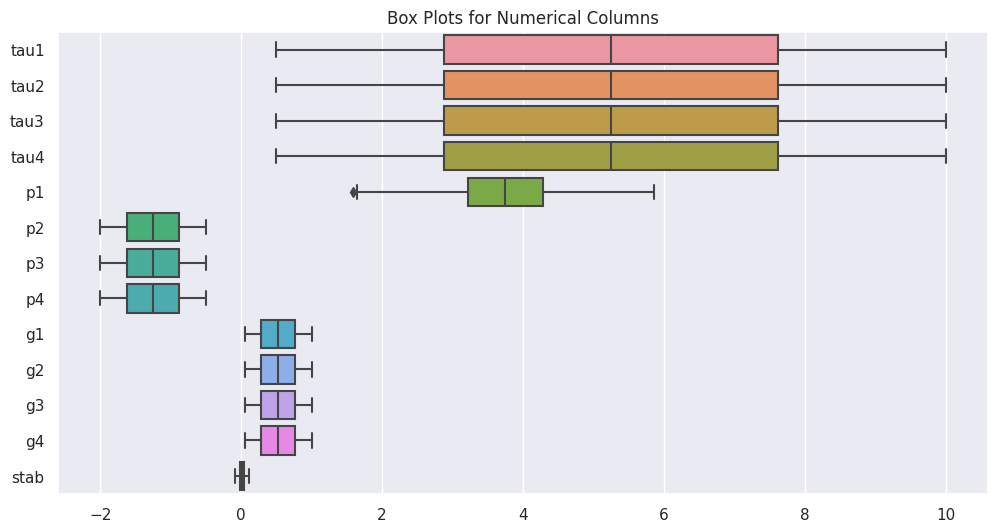

In [12]:
df = pd.DataFrame(smart_grid)

# Create box plots for numerical columns
plt.figure(figsize=(12, 6))
sns.boxplot(data=df.iloc[:, :-1], orient="h")
plt.title("Box Plots for Numerical Columns")
plt.show()

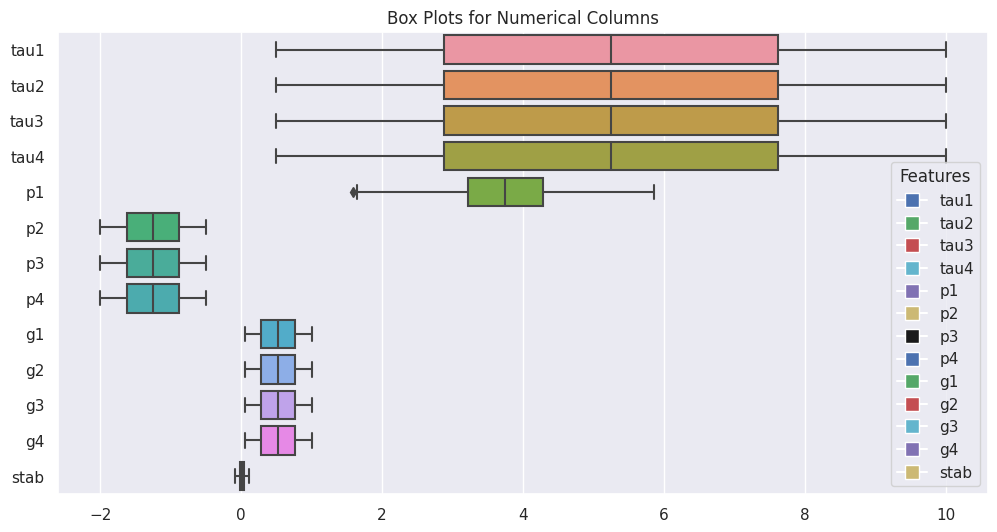

In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assume smart_grid is already defined
df = pd.DataFrame(smart_grid)

# Create box plots for numerical columns
plt.figure(figsize=(12, 6))
box_plot = sns.boxplot(data=df.iloc[:, :-1], orient="h")
plt.title("Box Plots for Numerical Columns")

# Create legend
# Creating an empty list for the handles
handles = []

# Populating the handles list with line objects
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k']  # Sample color list
for i, feature in enumerate(df.columns[:-1]):
    line = plt.Line2D([0], [0], marker='s', color='w', markerfacecolor=colors[i % len(colors)], markersize=10)
    handles.append(line)

# Attaching the legend with labels as the column names
plt.legend(handles, df.columns[:-1], title='Features')

plt.show()


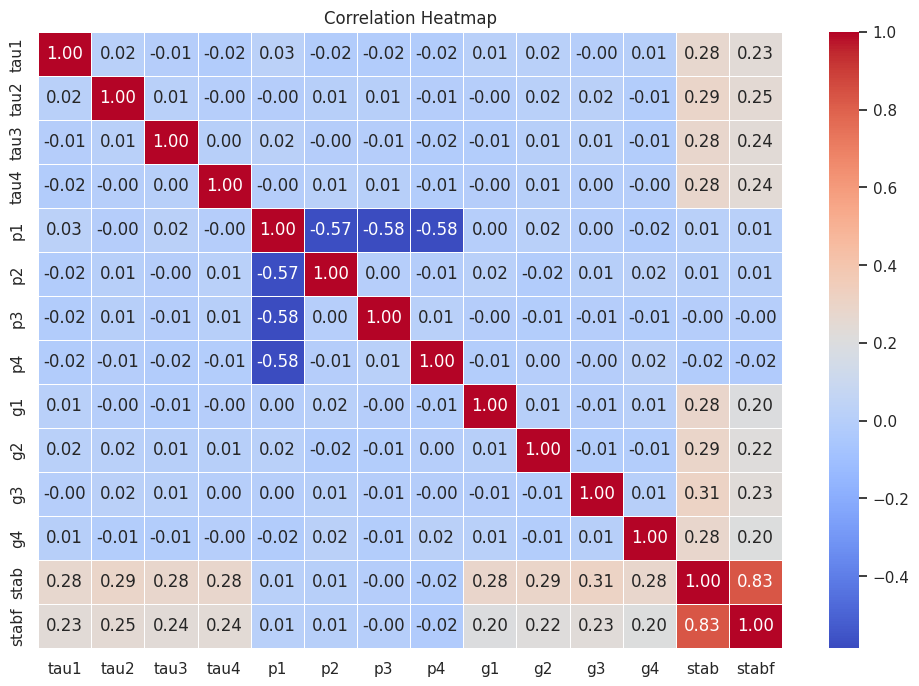

In [14]:


# Calculate the correlation matrix
corr_matrix = df.corr()

# Create a heatmap to visualize correlations
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()

In [15]:
import numpy as np
from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
%matplotlib inline

In [16]:
sns.set(style='white', context='notebook', rc={'figure.figsize':(14,10)})

In [17]:
smart_grid.head()

,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4,stab,stabf
0,2.959060,3.079885,8.381025,9.780754,3.763085,-0.782604,-1.257395,-1.723086,0.650456,0.859578,0.887445,0.958034,0.055347,1
1,9.304097,4.902524,3.047541,1.369357,5.067812,-1.940058,-1.872742,-1.255012,0.413441,0.862414,0.562139,0.781760,-0.005957,0
2,8.971707,8.848428,3.046479,1.214518,3.405158,-1.207456,-1.277210,-0.920492,0.163041,0.766689,0.839444,0.109853,0.003471,1
3,0.716415,7.669600,4.486641,2.340563,3.963791,-1.027473,-1.938944,-0.997374,0.446209,0.976744,0.929381,0.362718,0.028871,1
4,3.134112,7.608772,4.943759,9.857573,3.525811,-1.125531,-1.845975,-0.554305,0.797110,0.455450,0.656947,0.820923,0.049860,1


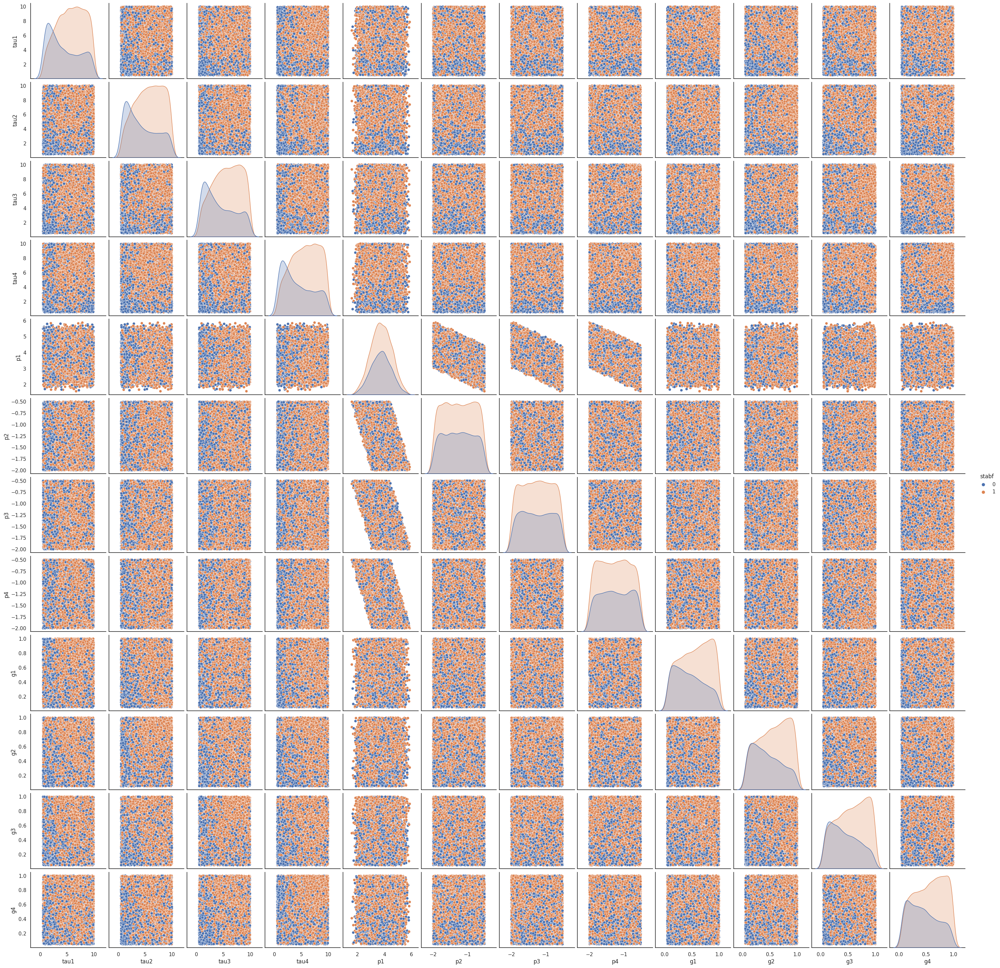

In [18]:
sns.pairplot(smart_grid.drop("stab", axis=1), hue='stabf');

In [19]:
!pip install pymrmr
!pip install umap-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.5/69.5 kB 1.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pymrmr: filename=pymrmr-0.1.11-cp310-cp310-linux_x86_64.whl size=391428 sha256=9039a99f3fab360de952b6968bc1487755307c88a98e888c91f5df091ccdc074
  Stored in directory: /root/.cache/pip/wheels/46/ae/55/4a2479c5f0de7eb363fe970cb18e4a750e03e4e63b1b5c2005
Successfully built pymrmr
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.8/90.8 kB 2.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 9.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for umap-learn: filename=umap_learn-0.5.4-py3-none-any.whl size=86770 sha256=4e62fd09efdede3fc9626cdebd375be7539f58646ab23122227effa4498abf49
  Stored in directory: /root/.cache/pip/wheels/fb/66/29/199acf5784d0f7b8add6d466175ab45506c96e386ed5dd0633
  Created wheel for pynndescent: filename=pynndescent-0.5.10-py3-none-any.whl

In [20]:
# Separate features and labels
X = smart_grid.drop(['stab', 'stabf'], axis=1)  # Drop 'stab' and 'stabf' columns
y = smart_grid['stabf']  # Stability labels

In [21]:
pip install pandas umap-learn pymrmr matplotlib seaborn


UMAP-reduced data:
     UMAP_1    UMAP_2    UMAP_3    UMAP_4    UMAP_5    UMAP_6
0  5.748543  2.594064  3.495022  4.520193  5.563756  5.158535
1  4.691265  7.552361  4.609308  4.210842  5.652948  5.403850
2  3.169852  7.248341  5.785310  4.867323  5.725597  5.406910
3  4.312689  4.643453  7.251607  3.565617  5.660993  5.203720
4  4.033067  2.900697  5.384480  5.853629  5.639283  5.191834


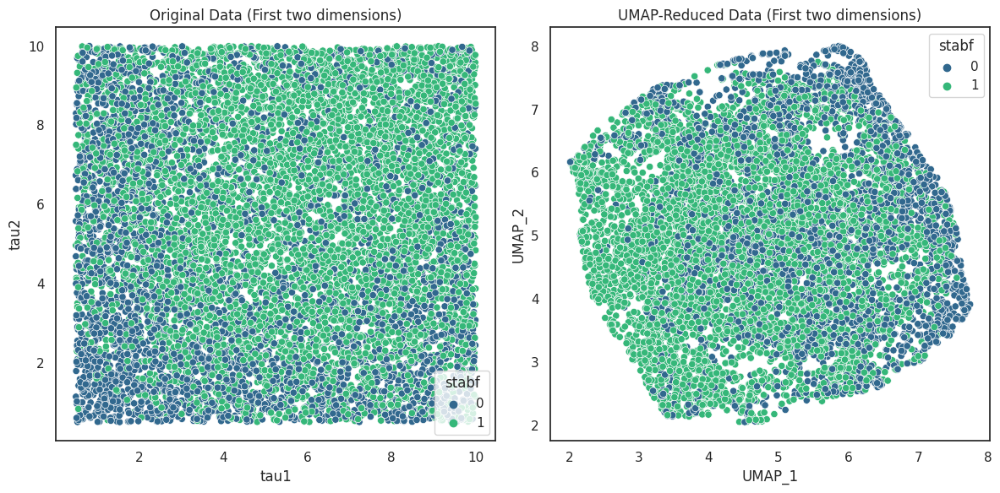

In [22]:
import pandas as pd
import umap
import pymrmr
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Apply UMAP for Feature Selection
reducer = umap.UMAP(n_components=6)  # Reduce to 5 dimensions (you can adjust this)
X_umap = reducer.fit_transform(X)

# Convert UMAP-reduced data to a DataFrame with appropriate column names
umap_feature_names = [f'UMAP_{i+1}' for i in range(X_umap.shape[1])]
X_umap_df = pd.DataFrame(X_umap, columns=umap_feature_names)


# Print UMAP-reduced data
print("UMAP-reduced data:")
print(X_umap_df.head())

# Plot original and UMAP-reduced data (First two dimensions)
plt.figure(figsize=(12, 6))

# Original Data
plt.subplot(1, 2, 1)
sns.scatterplot(x=X.iloc[:, 0], y=X.iloc[:, 1], hue=y, palette="viridis")
plt.title("Original Data (First two dimensions)")

# UMAP-reduced Data
plt.subplot(1, 2, 2)
sns.scatterplot(x=X_umap_df.iloc[:, 0], y=X_umap_df.iloc[:, 1], hue=y, palette="viridis")
plt.title("UMAP-Reduced Data (First two dimensions)")

plt.tight_layout()
plt.show()

In [23]:

# Apply MRMR for Feature Selection on UMAP-Reduced Data
# For this example, I'm selecting the top 3 features
selected_umap_features = pymrmr.mRMR(X_umap_df, 'MIQ', 3)

# Convert selected feature names to corresponding column indices in X_umap_df
selected_umap_indices = [X_umap_df.columns.get_loc(feature) for feature in selected_umap_features]

# Use the indices to get the original feature names
selected_original_features = X.columns[selected_umap_indices]

# Print the selected original features
print("Selected original features:")
print(selected_original_features)


Selected original features:
Index(['tau3', 'tau4', 'tau2'], dtype='object')


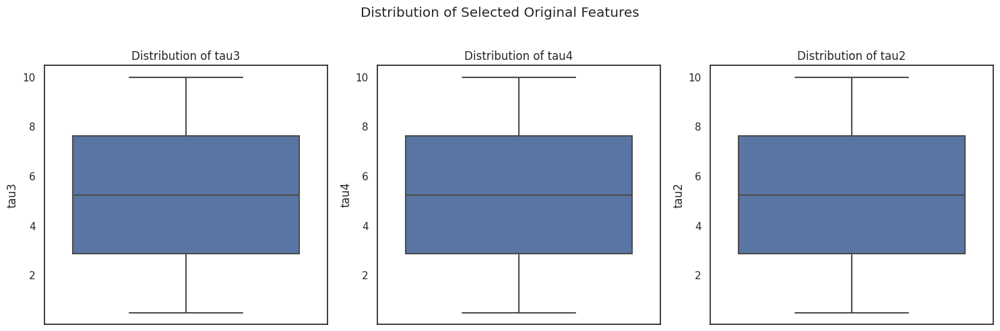

In [24]:
# Plotting the data for the selected original features
plt.figure(figsize=(15, 5))

for i, feature in enumerate(selected_original_features):
    plt.subplot(1, len(selected_original_features), i+1)
    sns.boxplot(y=X[feature])
    plt.title(f'Distribution of {feature}')

plt.suptitle("Distribution of Selected Original Features")
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

In [25]:
X_selected = X[selected_original_features]

# Print all rows for the selected features
print("\nValues of the selected features:")
print(X_selected.info())


Values of the selected features:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   tau3    10000 non-null  float64
 1   tau4    10000 non-null  float64
 2   tau2    10000 non-null  float64
dtypes: float64(3)
memory usage: 234.5 KB
None


SVC Accuracy: 0.752
XGBoost Accuracy: 0.7425
Extra Trees Accuracy: 0.743
Ensemble Accuracy: 0.752


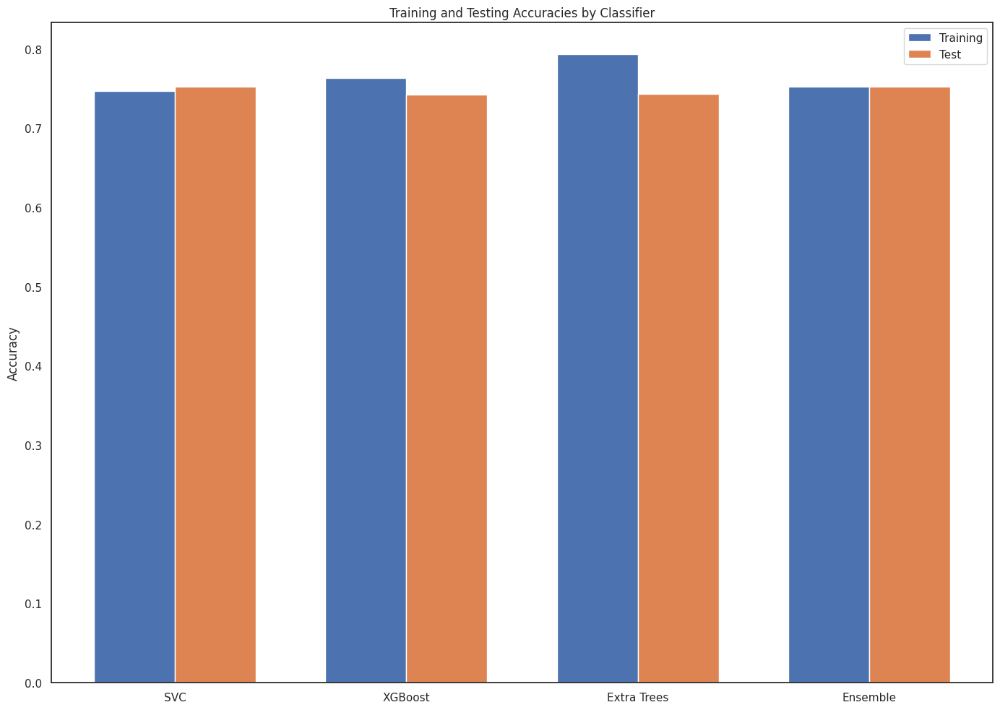

In [29]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pymrmr
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.metrics import accuracy_score


X = X[selected_original_features]

# Split the dataset
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize features
# scaler = StandardScaler()
# X_train_scaled = scaler.fit_transform(X_train)
# X_test_scaled = scaler.transform(X_test)

# # Initialize classifiers
# svc_clf = SVC(probability=True)
# xgb_clf = XGBClassifier()
# et_clf = ExtraTreesClassifier()

# # Fit classifiers
# svc_clf.fit(X_train_scaled, y_train)
# xgb_clf.fit(X_train_scaled, y_train)
# et_clf.fit(X_train_scaled, y_train)

# # Predict and calculate accuracies for individual classifiers
# svc_accuracy = accuracy_score(y_test, svc_clf.predict(X_test_scaled))
# xgb_accuracy = accuracy_score(y_test, xgb_clf.predict(X_test_scaled))
# et_accuracy = accuracy_score(y_test, et_clf.predict(X_test_scaled))

# print(f"SVC Accuracy: {svc_accuracy}")
# print(f"XGBoost Accuracy: {xgb_accuracy}")
# print(f"Extra Trees Accuracy: {et_accuracy}")





# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize and tune classifiers
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

svc_params = {'C': [0.1, 1, 10], 'kernel': ['linear', 'rbf']}
svc_clf = GridSearchCV(SVC(probability=True), svc_params, cv=cv)
svc_clf.fit(X_train_scaled, y_train)

xgb_params = {'n_estimators': [50, 100, 200, 300], 'learning_rate': [0.001, 0.01, 0.1, 0.3]}
xgb_clf = GridSearchCV(XGBClassifier(), xgb_params, cv=cv)
xgb_clf.fit(X_train_scaled, y_train)

et_params = {'n_estimators': [50, 100, 200, 300], 'max_depth': [None, 5, 10, 20]}
et_clf = GridSearchCV(ExtraTreesClassifier(), et_params, cv=cv)
et_clf.fit(X_train_scaled, y_train)

# Calculate accuracies
svc_accuracy = accuracy_score(y_test, svc_clf.predict(X_test_scaled))
xgb_accuracy = accuracy_score(y_test, xgb_clf.predict(X_test_scaled))
et_accuracy = accuracy_score(y_test, et_clf.predict(X_test_scaled))

print(f"SVC Accuracy: {svc_accuracy}")
print(f"XGBoost Accuracy: {xgb_accuracy}")
print(f"Extra Trees Accuracy: {et_accuracy}")




# Create an ensemble model
def ensemble_predict(X):
    svc_pred = svc_clf.predict_proba(X)
    xgb_pred = xgb_clf.predict_proba(X)
    et_pred = et_clf.predict_proba(X)

    # Weighted averaging
    ensemble_pred_proba = 0.7 * svc_pred + 0.20 * xgb_pred + 0.10 * et_pred

    # Choosing the class with the highest probability
    ensemble_pred = np.argmax(ensemble_pred_proba, axis=1)

    return ensemble_pred

# Ensemble accuracy
ensemble_predictions = ensemble_predict(X_test_scaled)
ensemble_accuracy = accuracy_score(y_test, ensemble_predictions)
print(f"Ensemble Accuracy: {ensemble_accuracy}")

# Plot training and testing accuracies
labels = ['SVC', 'XGBoost', 'Extra Trees', 'Ensemble']
training_accuracies = [
    accuracy_score(y_train, svc_clf.predict(X_train_scaled)),
    accuracy_score(y_train, xgb_clf.predict(X_train_scaled)),
    accuracy_score(y_train, et_clf.predict(X_train_scaled)),
    accuracy_score(y_train, ensemble_predict(X_train_scaled))
]
test_accuracies = [svc_accuracy, xgb_accuracy, et_accuracy, ensemble_accuracy]

x = np.arange(len(labels))
width = 0.35

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, training_accuracies, width, label='Training')
rects2 = ax.bar(x + width/2, test_accuracies, width, label='Test')

ax.set_ylabel('Accuracy')
ax.set_title('Training and Testing Accuracies by Classifier')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

fig.tight_layout()
plt.show()


In [31]:
pip install shap


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.9/547.9 kB 5.1 MB/s eta 0:00:00


The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning


  0%|          | 0/2000 [00:00<?, ?it/s]

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


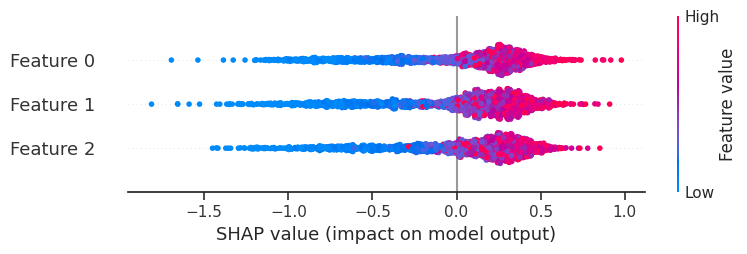

In [32]:
import numpy as np
import pandas as pd
import shap
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Train classifiers
clf_svc = SVC(probability=True)
clf_xgb = XGBClassifier()
clf_et = ExtraTreesClassifier()

clf_svc.fit(X_train_scaled, y_train)
clf_xgb.fit(X_train_scaled, y_train)
clf_et.fit(X_train_scaled, y_train)

# Compute SHAP values
explainer_svc = shap.KernelExplainer(clf_svc.predict_proba, shap.kmeans(X_train_scaled, 10))
shap_values_svc = explainer_svc.shap_values(X_test_scaled)

explainer_xgb = shap.Explainer(clf_xgb)
shap_values_xgb = explainer_xgb(X_test_scaled)

explainer_et = shap.TreeExplainer(clf_et)
shap_values_et = explainer_et.shap_values(X_test_scaled)

# Making sure SHAP values have the same shape
shap_values_svc = np.array(shap_values_svc[1]).reshape(2000, -1)
shap_values_xgb = np.array(shap_values_xgb.values).reshape(2000, -1)
shap_values_et = np.array(shap_values_et[1]).reshape(2000, -1)

# Average SHAP values
ensemble_shap_values = 0.3 * shap_values_svc[:, :8] + 0.4 * shap_values_xgb + 0.3 * shap_values_et[:, :8]

# Plotting SHAP summary plot for the ensemble
shap.summary_plot(ensemble_shap_values, X_test_scaled)

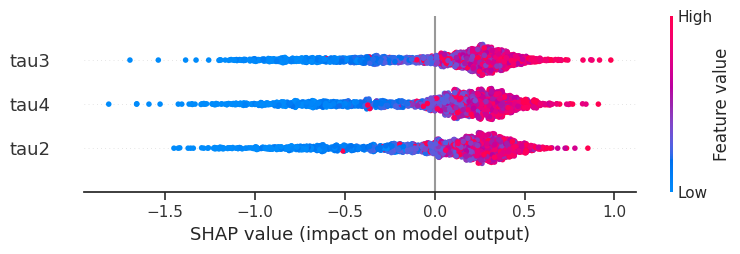

In [33]:
shap.summary_plot(ensemble_shap_values, X_test_scaled, feature_names=selected_original_features)

In [74]:
shap.initjs()  # Initialize JavaScript visualizations
shap.force_plot(explainer_svc.expected_value[1], shap_values_svc[0,:], X_test_scaled[0,:])


In [79]:
print("Shape of ensemble_shap_values: ", ensemble_shap_values.shape)
print("Shape of X_test_scaled: ", X_test_scaled.shape)


Shape of ensemble_shap_values:  (100, 3)
Shape of X_test_scaled:  (2000, 3)


In [78]:
import shap

# Initialize JavaScript visualization
shap.initjs()

# Create force plot for the first instance in the test set
shap.plots.force(ensemble_explanation[0])
